BY - HAREETIMA SONKAR
Task 4 

In [1]:
#Import all necessary modules/libraries
!pip install -q imageio
!pip install -q opencv-python
!pip install -q git+https://github.com/tensorflow/docs

  ERROR: Error [WinError 2] The system cannot find the file specified while executing command git version
ERROR: Cannot find command 'git' - do you have 'git' installed and in your PATH?


In [2]:
from absl import logging
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed
logging.set_verbosity(logging.ERROR)

import random
import re
import os
import tempfile
import ssl
import cv2
import numpy as np
import imageio
from IPython import display
from urllib import request 

In [3]:
#Helper functions for the UCF101 dataset
#As the UCF101 dataset was too large so, take help of some external website to help download our dataset.
UCF_ROOT = "https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/"
_VIDEO_LIST = None
_CACHE_DIR = tempfile.mkdtemp()
unverified_context = ssl._create_unverified_context()
def list_ucf_videos():
  global _VIDEO_LIST
  if not _VIDEO_LIST:
    index = request.urlopen(UCF_ROOT, context=unverified_context).read().decode("utf-8")
    videos = re.findall("(v_[\w_]+\.avi)", index)
    _VIDEO_LIST = sorted(set(videos))
  return list(_VIDEO_LIST)

def fetch_ucf_video(video):
  cache_path = os.path.join(_CACHE_DIR, video)
  if not os.path.exists(cache_path):
    urlpath = request.urljoin(UCF_ROOT, video)
    print("Fetching %s => %s" % (urlpath, cache_path))
    data = request.urlopen(urlpath, context=unverified_context).read()
    open(cache_path, "wb").write(data)
  return cache_path

def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]

def load_video(path, max_frames=0, resize=(224, 224)):
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)
      
      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

def to_gif(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, fps=25)
  return embed.embed_file('./animation.gif')

In [4]:
#Get the kinetics-400 labels
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map.txt"
with request.urlopen(KINETICS_URL) as obj:
  labels = [line.decode("utf-8").strip() for line in obj.readlines()]
print("Found in total %d labels." % len(labels))

Found in total 400 labels.


In [5]:
#UCF101 Dataset
ucf_videos = list_ucf_videos()
categories = {}
for video in ucf_videos:
  category = video[2:-12]
  if category not in categories:
    categories[category] = []
  categories[category].append(video)
print("Found in total %d videos in overall %d categories." % (len(ucf_videos), len(categories)))

print("\n")
head1 = "CATEGORY"
head2 = "No. of Videos"
head3 = "Details"
print(" ",head1," \t  ",head2," \t\t\t ",head3)
for category, sequences in categories.items():
  summary = ", ".join(sequences[:2])
  print("%-20s    %4d           %s, ..." % (category, len(sequences), summary))

Found in total 13320 videos in overall 101 categories.


  CATEGORY  	   No. of Videos  			  Details
ApplyEyeMakeup           145           v_ApplyEyeMakeup_g01_c01.avi, v_ApplyEyeMakeup_g01_c02.avi, ...
ApplyLipstick            114           v_ApplyLipstick_g01_c01.avi, v_ApplyLipstick_g01_c02.avi, ...
Archery                  145           v_Archery_g01_c01.avi, v_Archery_g01_c02.avi, ...
BabyCrawling             132           v_BabyCrawling_g01_c01.avi, v_BabyCrawling_g01_c02.avi, ...
BalanceBeam              108           v_BalanceBeam_g01_c01.avi, v_BalanceBeam_g01_c02.avi, ...
BandMarching             155           v_BandMarching_g01_c01.avi, v_BandMarching_g01_c02.avi, ...
BaseballPitch            150           v_BaseballPitch_g01_c01.avi, v_BaseballPitch_g01_c02.avi, ...
BasketballDunk           131           v_BasketballDunk_g01_c01.avi, v_BasketballDunk_g01_c02.avi, ...
Basketball               134           v_Basketball_g01_c01.avi, v_Basketball_g01_c02.avi, ...
BenchPress  

In [7]:
#Taking a random video
video_path = fetch_ucf_video("v_SkyDiving_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_SkyDiving_g01_c01.avi => C:\Users\Rishuraj\AppData\Local\Temp\tmprgkq4hcm\v_SkyDiving_g01_c01.avi


(187, 224, 224, 3)


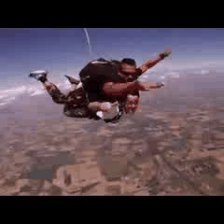

In [9]:
to_gif(sample_video1)

In [10]:
i3d = hub.load("https://tfhub.dev/deepmind/i3d-kinetics-400/1").signatures['default']

In [11]:
# Now Prediction time!!! 
def predict(sample_video):
  # Add a batch axis to the to the sample video.
  model_input = tf.constant(sample_video, dtype=tf.float32)[tf.newaxis, ...]

  logits = i3d(model_input)['default'][0]
  probabilities = tf.nn.softmax(logits)

  print("Top 5 actions:")
  for i in np.argsort(probabilities)[::-1][:5]:
    print(f"  {labels[i]:22}: {probabilities[i] * 100:5.2f}%")

In [12]:
predict(sample_video)

Top 5 actions:
  skydiving             : 99.93%
  paragliding           :  0.02%
  bungee jumping        :  0.01%
  kitesurfing           :  0.01%
  snorkeling            :  0.01%


In [13]:
# CHECKING FOR SOME VIDEOS THAT OUR MODEL IS GOOD OR NOT!!
#TAKE EXAMPLE 1 
video_path = fetch_ucf_video("v_Typing_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_Typing_g01_c01.avi => C:\Users\Rishuraj\AppData\Local\Temp\tmprgkq4hcm\v_Typing_g01_c01.avi


(127, 224, 224, 3)


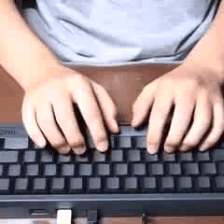

In [14]:
to_gif(sample_video1)

In [15]:
predict(sample_video)

Top 5 actions:
  using computer        : 100.00%
  drumming fingers      :  0.00%
  texting               :  0.00%
  using remote controller (not gaming):  0.00%
  jogging               :  0.00%


In [16]:
print("ITS ACCURACY IS GOOD !!")
print("IT PREDICTS IT AS USING COMPUTER")

ITS ACCURACY IS GOOD !!
IT PREDICTS IT AS USING COMPUTER


In [18]:
video_path = fetch_ucf_video("v_PushUps_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_PushUps_g01_c01.avi => C:\Users\Rishuraj\AppData\Local\Temp\tmprgkq4hcm\v_PushUps_g01_c01.avi


(56, 224, 224, 3)


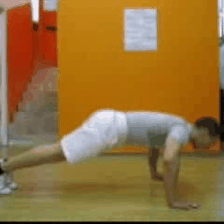

In [19]:
to_gif(sample_video1)

In [20]:
predict(sample_video)

Top 5 actions:
  push up               : 99.60%
  exercising with an exercise ball:  0.33%
  yoga                  :  0.03%
  stretching leg        :  0.01%
  lunge                 :  0.01%


In [21]:
video_path = fetch_ucf_video("v_CricketShot_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_CricketShot_g01_c01.avi => C:\Users\Rishuraj\AppData\Local\Temp\tmprgkq4hcm\v_CricketShot_g01_c01.avi


(84, 224, 224, 3)


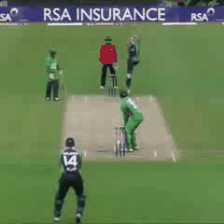

In [22]:
to_gif(sample_video1)

In [23]:
predict(sample_video)

Top 5 actions:
  playing cricket       : 99.99%
  robot dancing         :  0.00%
  shooting goal (soccer):  0.00%
  golf putting          :  0.00%
  tai chi               :  0.00%


In [25]:
print("******TASK COMPLETED SUCCESSFULLY******")

******TASK COMPLETED SUCCESSFULLY******
